## Author : Loka Akash Reddy
### Innomatics Research Labs - Data Science October - 2021
### Batch : Intern_Oct_2021
### Tasks - Data Analysis
### Task 2 : Exploratory Data Analysis
###  Kindly follow the instructions given in this document : https://drive.google.com/file/d/1EcUbFoJxUm94yN-qzYLqX9ZbxYNncZ8g/view?usp=sharing
### Dataset Link : https://drive.google.com/file/d/1mV_ifvzzrlPWgdSzrwW5ZK-aF3S9tydZ/view
### Data Description : https://docs.google.com/document/d/14d4n90nryAUgA-IdNSXJAFzmynn6WTT4XfS7N4tum7s/edit

### Step 1 - Introduction
### The detailed description about the dataset
The dataset was released by Aspiring Minds from the Aspiring Mind Employment Outcome 2015 (AMEO). The study is primarily limited  only to students with engineering disciplines. The dataset contains the employment outcomes of engineering graduates as dependent variables (Salary, Job Titles, and Job Locations) along with the standardized scores from three different areas – cognitive skills, technical skills and personality skills. The dataset also contains demographic features. The dataset  contains  around  40 independent variables and 4000 data points. The independent variables are both continuous and categorical in nature. The dataset contains a unique identifier for each candidate. Below mentioned table contains the details for the original dataset.

- ID: A unique ID to identify a candidate
- Salary: Annual CTC offered to the candidate (in INR)
- Gender: Candidate's gender
- DOB: Date of birth of the candidate
- 10percentage: Overall marks obtained in grade 10 examinations
- 10board: The school board whose curriculum the candidate followed in grade 10
- 12graduation: Year of graduation - senior year high school
- 12percentage: Overall marks obtained in grade 12 examinations
- 12board: The school board whose curriculum the candidate followed
- CollegeID: Unique ID identifying the university/college which the candidate attended for her/his undergraduate
- CollegeTier: Each college has been annotated as 1 or 2. The annotations have been computed from the average AMCAT scores obtained by the students in the college/university. Colleges with an average score above a threshold are tagged as 1 and others as 2.
- Degree: Degree obtained/pursued by the candidate
- Specialization: Specialization pursued by the candidate
- CollegeGPA: Aggregate GPA at graduation
- CollegeCityID: A unique ID to identify the city in which the college is located in.
- CollegeCityTier: The tier of the city in which the college is located in. This is annotated based on the population of the cities.
- CollegeState: Name of the state in which the college is located
- GraduationYear: Year of graduation (Bachelor's degree)
- English: Scores in AMCAT English section
- Logical: Score in AMCAT Logical ability section
- Quant: Score in AMCAT's Quantitative ability section
- Domain: Scores in AMCAT's domain module
- ComputerProgramming: Score in AMCAT's Computer programming section
- ElectronicsAndSemicon: Score in AMCAT's Electronics & Semiconductor Engineering section
- ComputerScience: Score in AMCAT's Computer Science section
- MechanicalEngg: Score in AMCAT's Mechanical Engineering section
- ElectricalEngg: Score in AMCAT's Electrical Engineering section
- TelecomEngg: Score in AMCAT's Telecommunication Engineering section
- CivilEngg: Score in AMCAT's Civil Engineering section
- conscientiousness: Scores in one of the sections of AMCAT's personality test
- agreeableness: Scores in one of the sections of AMCAT's personality test
- extraversion: Scores in one of the sections of AMCAT's personality test
- nueroticism: Scores in one of the sections of AMCAT's personality test
- openess_to_experience: Scores in one of the sections of AMCAT's personality test Note: To give you more context AMCAT is a job portal.

### Importing required libraries

In [1]:
import numpy as np
import pandas as pd
import os
import seaborn as sns
import matplotlib.pyplot as plt

from matplotlib import pyplot
%matplotlib inline
sns.set(style="whitegrid", color_codes=True)

pd.set_option('display.max_columns', None)

from scipy import stats as st
from scipy.stats import chi2_contingency as cst

In [2]:
import warnings
warnings.filterwarnings('ignore')

### Step 2
### Importing dataset

In [3]:
data = pd.read_excel("aspiring_minds_employability_outcomes_2015.xlsx")

In [4]:
data.head()

,Unnamed: 0,ID,Salary,DOJ,DOL,Designation,JobCity,Gender,DOB,10percentage,10board,12graduation,12percentage,12board,CollegeID,CollegeTier,Degree,Specialization,collegeGPA,CollegeCityID,CollegeCityTier,CollegeState,GraduationYear,English,Logical,Quant,Domain,ComputerProgramming,ElectronicsAndSemicon,ComputerScience,MechanicalEngg,ElectricalEngg,TelecomEngg,CivilEngg,conscientiousness,agreeableness,extraversion,nueroticism,openess_to_experience
0,train,203097,420000,2012-06-01,present,senior quality engineer,Bangalore,f,1990-02-19,84.3,"board ofsecondary education,ap",2007,95.8,"board of intermediate education,ap",1141,2,B.Tech/B.E.,computer engineering,78.00,1141,0,Andhra Pradesh,2011,515,585,525,0.635979,445,-1,-1,-1,-1,-1,-1,0.9737,0.8128,0.5269,1.35490,-0.4455
1,train,579905,500000,2013-09-01,present,assistant manager,Indore,m,1989-10-04,85.4,cbse,2007,85.0,cbse,5807,2,B.Tech/B.E.,electronics and communication engineering,70.06,5807,0,Madhya Pradesh,2012,695,610,780,0.960603,-1,466,-1,-1,-1,-1,-1,-0.7335,0.3789,1.2396,-0.10760,0.8637
2,train,810601,325000,2014-06-01,present,systems engineer,Chennai,f,1992-08-03,85.0,cbse,2010,68.2,cbse,64,2,B.Tech/B.E.,information technology,70.00,64,0,Uttar Pradesh,2014,615,545,370,0.450877,395,-1,-1,-1,-1,-1,-1,0.2718,1.7109,0.1637,-0.86820,0.6721
3,train,267447,1100000,2011-07-01,present,senior software engineer,Gurgaon,m,1989-12-05,85.6,cbse,2007,83.6,cbse,6920,1,B.Tech/B.E.,computer engineering,74.64,6920,1,Delhi,2011,635,585,625,0.974396,615,-1,-1,-1,-1,-1,-1,0.0464,0.3448,-0.3440,-0.40780,-0.9194
4,train,343523,200000,2014-03-01,2015-03-01 00:00:00,get,Manesar,m,1991-02-27,78.0,cbse,2008,76.8,cbse,11368,2,B.Tech/B.E.,electronics and communication engineering,73.90,11368,0,Uttar Pradesh,2012,545,625,465,0.124502,-1,233,-1,-1,-1,-1,-1,-0.8810,-0.2793,-1.0697,0.09163,-0.1295


### Analyzing the data

In [5]:
data.shape

(3998, 39)

In [6]:
data.columns

Index(['Unnamed: 0', 'ID', 'Salary', 'DOJ', 'DOL', 'Designation', 'JobCity',
       'Gender', 'DOB', '10percentage', '10board', '12graduation',
       '12percentage', '12board', 'CollegeID', 'CollegeTier', 'Degree',
       'Specialization', 'collegeGPA', 'CollegeCityID', 'CollegeCityTier',
       'CollegeState', 'GraduationYear', 'English', 'Logical', 'Quant',
       'Domain', 'ComputerProgramming', 'ElectronicsAndSemicon',
       'ComputerScience', 'MechanicalEngg', 'ElectricalEngg', 'TelecomEngg',
       'CivilEngg', 'conscientiousness', 'agreeableness', 'extraversion',
       'nueroticism', 'openess_to_experience'],
      dtype='object')

In [7]:
# Getting information about the Data
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3998 entries, 0 to 3997
Data columns (total 39 columns):
 #   Column                 Non-Null Count  Dtype         
---  ------                 --------------  -----         
 0   Unnamed: 0             3998 non-null   object        
 1   ID                     3998 non-null   int64         
 2   Salary                 3998 non-null   int64         
 3   DOJ                    3998 non-null   datetime64[ns]
 4   DOL                    3998 non-null   object        
 5   Designation            3998 non-null   object        
 6   JobCity                3998 non-null   object        
 7   Gender                 3998 non-null   object        
 8   DOB                    3998 non-null   datetime64[ns]
 9   10percentage           3998 non-null   float64       
 10  10board                3998 non-null   object        
 11  12graduation           3998 non-null   int64         
 12  12percentage           3998 non-null   float64       
 13  12b

In [8]:
data.describe()

,ID,Salary,10percentage,12graduation,12percentage,CollegeID,CollegeTier,collegeGPA,CollegeCityID,CollegeCityTier,GraduationYear,English,Logical,Quant,Domain,ComputerProgramming,ElectronicsAndSemicon,ComputerScience,MechanicalEngg,ElectricalEngg,TelecomEngg,CivilEngg,conscientiousness,agreeableness,extraversion,nueroticism,openess_to_experience
count,3.998000e+03,3.998000e+03,3998.000000,3998.000000,3998.000000,3998.000000,3998.000000,3998.000000,3998.000000,3998.000000,3998.000000,3998.000000,3998.000000,3998.000000,3998.000000,3998.000000,3998.000000,3998.000000,3998.000000,3998.000000,3998.000000,3998.000000,3998.000000,3998.000000,3998.000000,3998.000000,3998.000000
mean,6.637945e+05,3.076998e+05,77.925443,2008.087544,74.466366,5156.851426,1.925713,71.486171,5156.851426,0.300400,2012.105803,501.649075,501.598799,513.378189,0.510490,353.102801,95.328414,90.742371,22.974737,16.478739,31.851176,2.683842,-0.037831,0.146496,0.002763,-0.169033,-0.138110
std,3.632182e+05,2.127375e+05,9.850162,1.653599,10.999933,4802.261482,0.262270,8.167338,4802.261482,0.458489,31.857271,104.940021,86.783297,122.302332,0.468671,205.355519,158.241218,175.273083,98.123311,87.585634,104.852845,36.658505,1.028666,0.941782,0.951471,1.007580,1.008075
min,1.124400e+04,3.500000e+04,43.000000,1995.000000,40.000000,2.000000,1.000000,6.450000,2.000000,0.000000,0.000000,180.000000,195.000000,120.000000,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,-4.126700,-5.781600,-4.600900,-2.643000,-7.375700
25%,3.342842e+05,1.800000e+05,71.680000,2007.000000,66.000000,494.000000,2.000000,66.407500,494.000000,0.000000,2012.000000,425.000000,445.000000,430.000000,0.342315,295.000000,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,-0.713525,-0.287100,-0.604800,-0.868200,-0.669200
50%,6.396000e+05,3.000000e+05,79.150000,2008.000000,74.400000,3879.000000,2.000000,71.720000,3879.000000,0.000000,2013.000000,500.000000,505.000000,515.000000,0.622643,415.000000,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,0.046400,0.212400,0.091400,-0.234400,-0.094300
75%,9.904800e+05,3.700000e+05,85.670000,2009.000000,82.600000,8818.000000,2.000000,76.327500,8818.000000,1.000000,2014.000000,570.000000,565.000000,595.000000,0.842248,495.000000,233.000000,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,0.702700,0.812800,0.672000,0.526200,0.502400
max,1.298275e+06,4.000000e+06,97.760000,2013.000000,98.700000,18409.000000,2.000000,99.930000,18409.000000,1.000000,2017.000000,875.000000,795.000000,900.000000,0.999910,840.000000,612.000000,715.000000,623.000000,676.000000,548.000000,516.000000,1.995300,1.904800,2.535400,3.352500,1.822400


In [9]:
data.describe(include='all')

,Unnamed: 0,ID,Salary,DOJ,DOL,Designation,JobCity,Gender,DOB,10percentage,10board,12graduation,12percentage,12board,CollegeID,CollegeTier,Degree,Specialization,collegeGPA,CollegeCityID,CollegeCityTier,CollegeState,GraduationYear,English,Logical,Quant,Domain,ComputerProgramming,ElectronicsAndSemicon,ComputerScience,MechanicalEngg,ElectricalEngg,TelecomEngg,CivilEngg,conscientiousness,agreeableness,extraversion,nueroticism,openess_to_experience
count,3998,3.998000e+03,3.998000e+03,3998,3998,3998,3998,3998,3998,3998.000000,3998,3998.000000,3998.000000,3998,3998.000000,3998.000000,3998,3998,3998.000000,3998.000000,3998.000000,3998,3998.000000,3998.000000,3998.000000,3998.000000,3998.000000,3998.000000,3998.000000,3998.000000,3998.000000,3998.000000,3998.000000,3998.000000,3998.000000,3998.000000,3998.000000,3998.000000,3998.000000
unique,1,NaN,NaN,81,67,419,339,2,1872,NaN,275,NaN,NaN,340,NaN,NaN,4,46,NaN,NaN,NaN,26,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
top,train,NaN,NaN,2014-07-01 00:00:00,present,software engineer,Bangalore,m,1991-01-01 00:00:00,NaN,cbse,NaN,NaN,cbse,NaN,NaN,B.Tech/B.E.,electronics and communication engineering,NaN,NaN,NaN,Uttar Pradesh,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
freq,3998,NaN,NaN,199,1875,539,627,3041,11,NaN,1395,NaN,NaN,1400,NaN,NaN,3700,880,NaN,NaN,NaN,915,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
first,NaN,NaN,NaN,1991-06-01 00:00:00,NaN,NaN,NaN,NaN,1977-10-30 00:00:00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
last,NaN,NaN,NaN,2015-12-01 00:00:00,NaN,NaN,NaN,NaN,1997-05-27 00:00:00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
mean,NaN,6.637945e+05,3.076998e+05,NaN,NaN,NaN,NaN,NaN,NaN,77.925443,NaN,2008.087544,74.466366,NaN,5156.851426,1.925713,NaN,NaN,71.486171,5156.851426,0.300400,NaN,2012.105803,501.649075,501.598799,513.378189,0.510490,353.102801,95.328414,90.742371,22.974737,16.478739,31.851176,2.683842,-0.037831,0.146496,0.002763,-0.169033,-0.138110
std,NaN,3.632182e+05,2.127375e+05,NaN,NaN,NaN,NaN,NaN,NaN,9.850162,NaN,1.653599,10.999933,NaN,4802.261482,0.262270,NaN,NaN,8.167338,4802.261482,0.458489,NaN,31.857271,104.940021,86.783297,122.302332,0.468671,205.355519,158.241218,175.273083,98.123311,87.585634,104.852845,36.658505,1.028666,0.941782,0.951471,1.007580,1.008075
min,NaN,1.124400e+04,3.500000e+04,NaN,NaN,NaN,NaN,NaN,NaN,43.000000,NaN,1995.000000,40.000000,NaN,2.000000,1.000000,NaN,NaN,6.450000,2.000000,0.000000,NaN,0.000000,180.000000,195.000000,120.000000,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,-4.126700,-5.781600,-4.600900,-2.643000,-7.375700
25%,NaN,3.342842e+05,1.800000e+05,NaN,NaN,NaN,NaN,NaN,NaN,71.680000,NaN,2007.000000,66.000000,NaN,494.000000,2.000000,NaN,NaN,66.407500,494.000000,0.000000,NaN,2012.000000,425.000000,445.000000,430.000000,0.342315,295.000000,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,-0.713525,-0.287100,-0.604800,-0.868200,-0.669200


In [10]:
data.isna().sum()

Unnamed: 0               0
ID                       0
Salary                   0
DOJ                      0
DOL                      0
Designation              0
JobCity                  0
Gender                   0
DOB                      0
10percentage             0
10board                  0
12graduation             0
12percentage             0
12board                  0
CollegeID                0
CollegeTier              0
Degree                   0
Specialization           0
collegeGPA               0
CollegeCityID            0
CollegeCityTier          0
CollegeState             0
GraduationYear           0
English                  0
Logical                  0
Quant                    0
Domain                   0
ComputerProgramming      0
ElectronicsAndSemicon    0
ComputerScience          0
MechanicalEngg           0
ElectricalEngg           0
TelecomEngg              0
CivilEngg                0
conscientiousness        0
agreeableness            0
extraversion             0
n

### Univariate Analysis

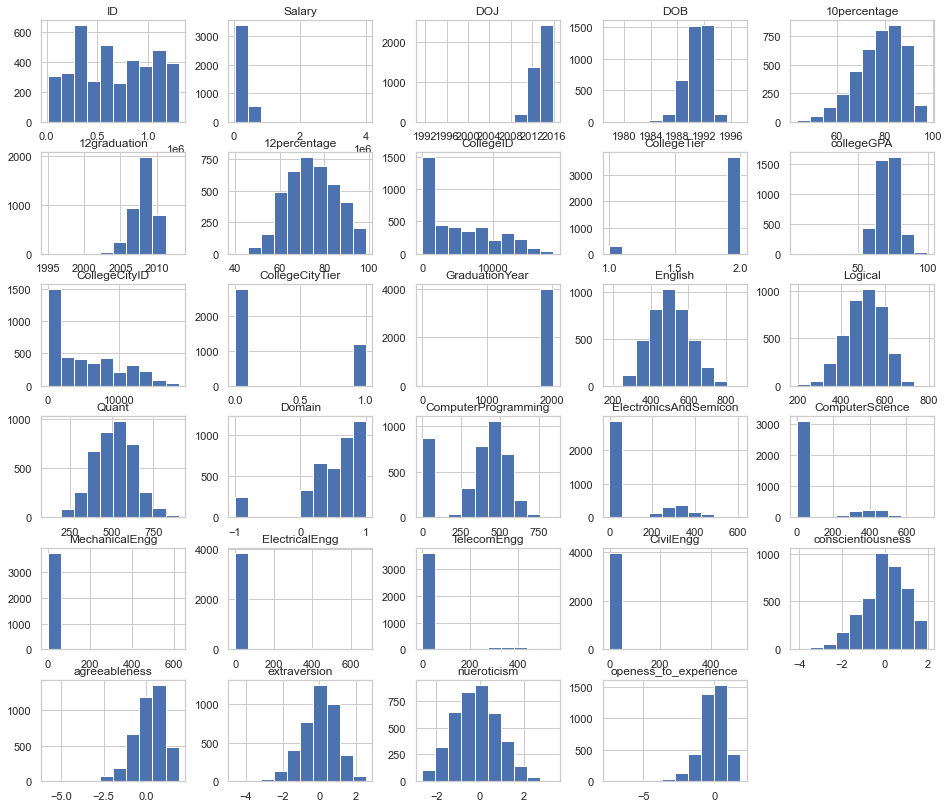

In [11]:
data.hist(figsize=(16, 14))
pyplot.show()

<AxesSubplot:>

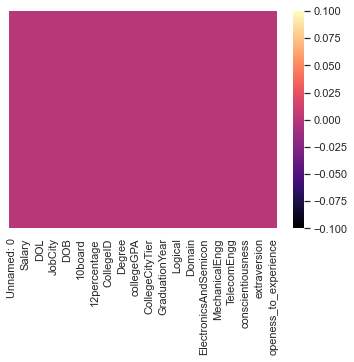

In [12]:
sns.heatmap(data.isnull(), yticklabels=False, cmap="magma")

In [13]:
num_males = data['Gender'].where(data['Gender'] == 'm').count()
num_females = data['Gender'].where(data['Gender'] == 'f').count()
print('Number of male candidates : {}'.format(num_males))
print('Number of female candidates : {}'.format(num_females))
print('Male to Female ratio: {:.2f}'.format(num_males/num_females))

Number of male candidates : 3041
Number of female candidates : 957
Male to Female ratio: 3.18


<AxesSubplot:>

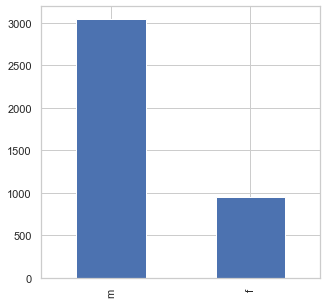

In [14]:
data['Gender'].value_counts().plot(kind='bar', figsize=(5,5))
#this is a bar plot of the gender category 
#m=Male f=Female

Text(0.5, 0.98, 'Salary levels by gender')

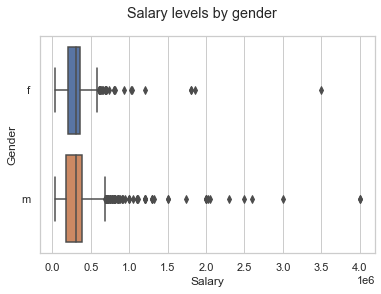

In [15]:
#boxplot visualization of salary levels by gender
#median salary of males is slightly greater than that of females.
#higher outliers are observed in male category. Indicating that salaries above normal are earned more by males.
sns.boxplot(x='Salary', y = 'Gender', data=data)
plt.suptitle('Salary levels by gender')

(array([3.398e+03, 5.500e+02, 2.700e+01, 6.000e+00, 8.000e+00, 3.000e+00,
        2.000e+00, 1.000e+00, 1.000e+00, 2.000e+00]),
 array([  35000.,  431500.,  828000., 1224500., 1621000., 2017500.,
        2414000., 2810500., 3207000., 3603500., 4000000.]),
 <BarContainer object of 10 artists>)

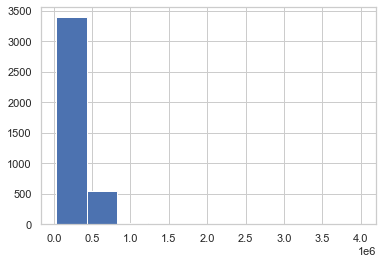

In [16]:
#histogram of salary data
plt.hist(data['Salary'],bins=10)

### Numerical and Categorical Column names

We drop the unnamed column as it doesn't look to have any importance here. But for safefy reasons we will slice the dataframe.

In [17]:
categ=list()
numeric=list()
other=list()
for c,t in zip(data.dtypes.index.to_list(), data.dtypes.to_list()):
    if t=="object":
        categ.append([c,t])
    elif t=="int64" or t=="float64":
        numeric.append([c,t])
    else:
        other.append([c,t])
print("Numerical Cols :",numeric)
print("\ncategorical Cols :",categ)
print("\nDate time :",other)

Numerical Cols : [['ID', dtype('int64')], ['Salary', dtype('int64')], ['10percentage', dtype('float64')], ['12graduation', dtype('int64')], ['12percentage', dtype('float64')], ['CollegeID', dtype('int64')], ['CollegeTier', dtype('int64')], ['collegeGPA', dtype('float64')], ['CollegeCityID', dtype('int64')], ['CollegeCityTier', dtype('int64')], ['GraduationYear', dtype('int64')], ['English', dtype('int64')], ['Logical', dtype('int64')], ['Quant', dtype('int64')], ['Domain', dtype('float64')], ['ComputerProgramming', dtype('int64')], ['ElectronicsAndSemicon', dtype('int64')], ['ComputerScience', dtype('int64')], ['MechanicalEngg', dtype('int64')], ['ElectricalEngg', dtype('int64')], ['TelecomEngg', dtype('int64')], ['CivilEngg', dtype('int64')], ['conscientiousness', dtype('float64')], ['agreeableness', dtype('float64')], ['extraversion', dtype('float64')], ['nueroticism', dtype('float64')], ['openess_to_experience', dtype('float64')]]

categorical Cols : [['Unnamed: 0', dtype('O')], ['D

After looking at the datatypes we see that 71 percent of columns are numerical and 23 percent are categorical and 5 percent are dates.

### Lets see the summary of dataset

In [18]:
data.columns

Index(['Unnamed: 0', 'ID', 'Salary', 'DOJ', 'DOL', 'Designation', 'JobCity',
       'Gender', 'DOB', '10percentage', '10board', '12graduation',
       '12percentage', '12board', 'CollegeID', 'CollegeTier', 'Degree',
       'Specialization', 'collegeGPA', 'CollegeCityID', 'CollegeCityTier',
       'CollegeState', 'GraduationYear', 'English', 'Logical', 'Quant',
       'Domain', 'ComputerProgramming', 'ElectronicsAndSemicon',
       'ComputerScience', 'MechanicalEngg', 'ElectricalEngg', 'TelecomEngg',
       'CivilEngg', 'conscientiousness', 'agreeableness', 'extraversion',
       'nueroticism', 'openess_to_experience'],
      dtype='object')

In [19]:
np.round(data.describe())

,ID,Salary,10percentage,12graduation,12percentage,CollegeID,CollegeTier,collegeGPA,CollegeCityID,CollegeCityTier,GraduationYear,English,Logical,Quant,Domain,ComputerProgramming,ElectronicsAndSemicon,ComputerScience,MechanicalEngg,ElectricalEngg,TelecomEngg,CivilEngg,conscientiousness,agreeableness,extraversion,nueroticism,openess_to_experience
count,3998.0,3998.0,3998.0,3998.0,3998.0,3998.0,3998.0,3998.0,3998.0,3998.0,3998.0,3998.0,3998.0,3998.0,3998.0,3998.0,3998.0,3998.0,3998.0,3998.0,3998.0,3998.0,3998.0,3998.0,3998.0,3998.0,3998.0
mean,663795.0,307700.0,78.0,2008.0,74.0,5157.0,2.0,71.0,5157.0,0.0,2012.0,502.0,502.0,513.0,1.0,353.0,95.0,91.0,23.0,16.0,32.0,3.0,-0.0,0.0,0.0,-0.0,-0.0
std,363218.0,212737.0,10.0,2.0,11.0,4802.0,0.0,8.0,4802.0,0.0,32.0,105.0,87.0,122.0,0.0,205.0,158.0,175.0,98.0,88.0,105.0,37.0,1.0,1.0,1.0,1.0,1.0
min,11244.0,35000.0,43.0,1995.0,40.0,2.0,1.0,6.0,2.0,0.0,0.0,180.0,195.0,120.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-4.0,-6.0,-5.0,-3.0,-7.0
25%,334284.0,180000.0,72.0,2007.0,66.0,494.0,2.0,66.0,494.0,0.0,2012.0,425.0,445.0,430.0,0.0,295.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-0.0,-1.0,-1.0,-1.0
50%,639600.0,300000.0,79.0,2008.0,74.0,3879.0,2.0,72.0,3879.0,0.0,2013.0,500.0,505.0,515.0,1.0,415.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,0.0,0.0,0.0,-0.0,-0.0
75%,990480.0,370000.0,86.0,2009.0,83.0,8818.0,2.0,76.0,8818.0,1.0,2014.0,570.0,565.0,595.0,1.0,495.0,233.0,-1.0,-1.0,-1.0,-1.0,-1.0,1.0,1.0,1.0,1.0,1.0
max,1298275.0,4000000.0,98.0,2013.0,99.0,18409.0,2.0,100.0,18409.0,1.0,2017.0,875.0,795.0,900.0,1.0,840.0,612.0,715.0,623.0,676.0,548.0,516.0,2.0,2.0,3.0,3.0,2.0


From above we can see that for salary most of the data looks towards the max, but we can't say much about other columns precisely as there are null values and that needs to be cleaned, then only we can do our analysis.

Lets check dummy values filled in some columns and replace or remove depending on what we see.

We see that the dates are in the format of timestamp, so lets change them to dates and lets change the present in DOL to today's date, so the columns will have proper dates.

In [20]:
import datetime as dt
data["DOJ"]=pd.to_datetime(data["DOJ"]).dt.date
data["DOL"].replace("present",dt.datetime.today(),inplace=True)
data["DOL"]=pd.to_datetime(data["DOL"]).dt.date
data["Year"]=pd.to_datetime(data["DOL"]).dt.year
data["Month"]=pd.to_datetime(data["DOL"]).dt.month
data["Day"]=pd.to_datetime(data["DOL"]).dt.day

In designation, we can see one garbage value "get". So we don't know what proffesion is that or whatever. So we will replace it with mode.

Lets check what cities lie besides -1 and based on that lets see the profession if we can find else we will replace by mode.

In [21]:
data[data["Designation"]=="get"][["ID","JobCity"]]

,ID,JobCity
4,343523,Manesar
332,597966,-1
350,38162,Faridabad
1717,330551,Hyderabad
1897,1064862,Hyderabad
2140,796296,Indore
2318,1094242,Lucknow
2443,1259589,kharagpur
2666,110817,Hyderabad
2757,1083682,Nashik


In the above cell we can see that Hyderabad has multiple counts when we count the value. So lets make it standard.

As we can see all the values are having capital letter as start. We could have converted them to uppercase, lowecase or start letter lowercase anything you want.

In [22]:
data["JobCity"].replace(-1,"Unknown",inplace=True)
data["JobCity"]=data["JobCity"].apply(lambda x:x.title())
data["JobCity"].replace("Mumbai ","Mumbai",inplace=True)

In [23]:
data["JobCity"].value_counts()

Bangalore                               647
Unknown                                 461
Noida                                   386
Hyderabad                               357
Pune                                    320
                                       ... 
Roorkee                                   1
Kolhapur                                  1
Dammam                                    1
Kochi/Cochin, Chennai And Coimbatore      1
Gwalior                                   1
Name: JobCity, Length: 261, dtype: int64

Now lets check what values other colums have with get as value in designation using median or mode we will replace get

### Categorical Analysis

In [24]:
data[data["Designation"]=="get"][["Year","Month","JobCity","Gender","10percentage","10board","12percentage","12board","Degree","Specialization","CollegeState","GraduationYear"]].mode()

,Year,Month,JobCity,Gender,10percentage,10board,12percentage,12board,Degree,Specialization,CollegeState,GraduationYear
0,2021.0,11.0,Hyderabad,m,80.0,cbse,64.20,cbse,B.Tech/B.E.,mechanical engineering,Uttar Pradesh,2014.0
1,NaN,NaN,NaN,NaN,NaN,NaN,67.00,NaN,NaN,NaN,NaN,NaN
2,NaN,NaN,NaN,NaN,NaN,NaN,72.00,NaN,NaN,NaN,NaN,NaN
3,NaN,NaN,NaN,NaN,NaN,NaN,73.40,NaN,NaN,NaN,NaN,NaN
4,NaN,NaN,NaN,NaN,NaN,NaN,73.80,NaN,NaN,NaN,NaN,NaN
5,NaN,NaN,NaN,NaN,NaN,NaN,74.40,NaN,NaN,NaN,NaN,NaN
6,NaN,NaN,NaN,NaN,NaN,NaN,74.53,NaN,NaN,NaN,NaN,NaN
7,NaN,NaN,NaN,NaN,NaN,NaN,76.00,NaN,NaN,NaN,NaN,NaN
8,NaN,NaN,NaN,NaN,NaN,NaN,76.80,NaN,NaN,NaN,NaN,NaN
9,NaN,NaN,NaN,NaN,NaN,NaN,79.90,NaN,NaN,NaN,NaN,NaN


### Numerical Analysis

In [25]:
data[data["Designation"]=="get"][["10percentage","12percentage","collegeGPA","Salary"]].mode()

,10percentage,12percentage,collegeGPA,Salary
0,80.0,64.20,61.00,180000.0
1,NaN,67.00,64.00,200000.0
2,NaN,72.00,65.05,NaN
3,NaN,73.40,66.67,NaN
4,NaN,73.80,67.00,NaN
5,NaN,74.40,68.00,NaN
6,NaN,74.53,71.00,NaN
7,NaN,76.00,73.00,NaN
8,NaN,76.80,73.30,NaN
9,NaN,79.90,73.90,NaN


Lets check each column values one by one instead of all at once. We can check all values at once as thats comvinient but all value filters may or may not match and removing columns from filter become tedious and we too don't know how to set the filter accurately. So we take mode of designation by comparing to each column one by one and putting those mode value in a list and then taking a mode. This will be like each column voting for a designation and then selecting value having max counts.

Each With only 4 ot 5 columns is also enough but more the columns better the accuracy

In [26]:
getValue=[]

In [27]:
getValue.append(data[(data["Year"]==2021) | (data["Month"]==7)]["Designation"].mode().to_list()[0])
getValue.append(data[data["JobCity"]=="Hyderabad"]["Designation"].mode().to_list()[0])
getValue.append(data[data["Gender"]=="m"]["Designation"].mode().to_list()[0])
getValue.append(data[data["10percentage"]==80]["Designation"].mode().to_list()[0])
getValue.append(data[data["10board"]=="cbse"]["Designation"].mode().to_list()[0])
getValue.append(data[data["12percentage"]==64.2]["Designation"].mode().to_list()[0])
getValue.append(data[data["12board"]=="cbse"]["Designation"].mode().to_list()[0])
getValue.append(data[data["Degree"].str.startswith("B.Tech/")]["Designation"].mode().to_list()[0])
getValue.append(data[data["Specialization"].str.startswith("mechanical")]["Designation"].mode().to_list()[0])
getValue.append(data[data["CollegeState"].str.startswith("Uttar Pradesh")]["Designation"].mode().to_list()[0])
getValue.append(data[data["GraduationYear"]==2014]["Designation"].mode().to_list()[0])

In [28]:
getValue

['software engineer',
 'software engineer',
 'software engineer',
 'software engineer',
 'software engineer',
 'get',
 'software engineer',
 'software engineer',
 'production engineer',
 'software engineer',
 'software engineer']

In [29]:
designation_value=pd.DataFrame({"DesignationValue":getValue})

In [30]:
designation_value=designation_value["DesignationValue"].mode().to_list()[0]

In [31]:
data["Designation"].replace("get",designation_value,inplace=True)

### Now Replacing "Unknown" Value in Job City

In [32]:
data[data["JobCity"]=="Unknown"][["Year","Month","Designation","10percentage","12percentage","collegeGPA","Salary","Degree","Specialization","CollegeState","GraduationYear"]].mode()

,Year,Month,Designation,10percentage,12percentage,collegeGPA,Salary,Degree,Specialization,CollegeState,GraduationYear
0,2021.0,11.0,software engineer,76.0,64.0,70.0,200000.0,B.Tech/B.E.,electronics and communication engineering,Uttar Pradesh,2013.0
1,NaN,NaN,NaN,78.0,66.0,72.0,NaN,NaN,NaN,NaN,NaN
2,NaN,NaN,NaN,82.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [33]:
getValue_1=[]

In [34]:
getValue_1.append(data[(data["Year"]==2021) | (data["Month"]==7)]["JobCity"].mode().to_list()[0])
getValue_1.append(data[data["Designation"]=="software engineer"]["JobCity"].mode().to_list()[0])
getValue_1.append(data[data["Gender"]=="m"]["JobCity"].mode().to_list()[0])
getValue_1.append(data[data["10percentage"]==76]["JobCity"].mode().to_list()[0])
getValue_1.append(data[data["10board"]=="cbse"]["JobCity"].mode().to_list()[0])
getValue_1.append(data[data["12percentage"]==64]["JobCity"].mode().to_list()[0])
getValue_1.append(data[data["12board"]=="cbse"]["JobCity"].mode().to_list()[0])
getValue_1.append(data[data["collegeGPA"]==70]["JobCity"].mode().to_list()[0])
getValue_1.append(data[data["Salary"]==200000]["JobCity"].mode().to_list()[0])
getValue_1.append(data[data["Degree"].str.startswith("B.Tech/")]["JobCity"].mode().to_list()[0])
getValue_1.append(data[data["Specialization"].str.startswith("electronics and communication eng")]["JobCity"].mode().to_list()[0])
getValue_1.append(data[data["CollegeState"].str.startswith("Uttar Pradesh")]["JobCity"].mode().to_list()[0])
getValue_1.append(data[data["GraduationYear"]==2013]["JobCity"].mode().to_list()[0])

In [35]:
city_value=pd.DataFrame({"CityValue":getValue_1})
city_value=city_value["CityValue"].mode().to_list()[0]
data["JobCity"].replace("Unknown",city_value,inplace=True)
data["JobCity"].replace("Bangalore","Bengalru",inplace=True)
data["JobCity"].replace("Banaglore","Bengalru",inplace=True)
data["JobCity"].replace("Chennai, Bangalore","Bengalru",inplace=True)
data["JobCity"].replace(" Bangalore","Bengalru",inplace=True)
data["JobCity"].replace("Bangalore ","Bengalru",inplace=True)
data["JobCity"].replace("Banglore","Bengalru",inplace=True)
data["JobCity"].replace("Jaipur ","Jaipur",inplace=True)
data["JobCity"].replace("Gandhinagar","Gandhi Nagar",inplace=True)
data["JobCity"].replace("Bangalore ","Bengalru",inplace=True)
data["JobCity"].replace("Jaipur ","Jaipur",inplace=True)
data["JobCity"].replace("Gandhinagar","Gandhi Nagar",inplace=True)
data["JobCity"].replace("Hyderabad ","Hyderabad",inplace=True)
data["JobCity"].replace("Hyderabad(Bhadurpally)","Hyderabad",inplace=True)
data["JobCity"].replace("Bhubaneswar ","Bhubaneswar",inplace=True)
data["JobCity"].replace("Delhi/Ncr","Delhi",inplace=True)
data["JobCity"].replace("Nagpur ","Nagpur",inplace=True)
data["JobCity"].replace("Pune ","Pune",inplace=True)
data["JobCity"].replace("Trivandrum ","Trivandrum",inplace=True)
data["JobCity"].replace("Thiruvananthapuram","Trivandrum",inplace=True)
data.drop(2450,inplace=True,axis=0)

In [36]:
data[data["JobCity"]=="Navi Mumbai , Hyderabad"]

,Unnamed: 0,ID,Salary,DOJ,DOL,Designation,JobCity,Gender,DOB,10percentage,10board,12graduation,12percentage,12board,CollegeID,CollegeTier,Degree,Specialization,collegeGPA,CollegeCityID,CollegeCityTier,CollegeState,GraduationYear,English,Logical,Quant,Domain,ComputerProgramming,ElectronicsAndSemicon,ComputerScience,MechanicalEngg,ElectricalEngg,TelecomEngg,CivilEngg,conscientiousness,agreeableness,extraversion,nueroticism,openess_to_experience,Year,Month,Day


We have replaced bangalore spelling with names of thier cities like bangalore to bengalru thats it.

### Now replacing "0" in 10board

In [37]:
data[data["10board"]==0][["Year","Month","Gender","JobCity","Designation","10percentage","12percentage","12board","collegeGPA","Salary","Degree","Specialization","CollegeState","GraduationYear"]].mode()

,Year,Month,Gender,JobCity,Designation,10percentage,12percentage,12board,collegeGPA,Salary,Degree,Specialization,CollegeState,GraduationYear
0,2021.0,11.0,m,Bengalru,software engineer,75.0,65.0,0,65.0,400000.0,B.Tech/B.E.,computer engineering,Tamil Nadu,2012.0
1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,72.0,NaN,NaN,NaN,NaN,NaN


In [38]:
getValue_2=[]

In [39]:
getValue_2.append(data[(data["Year"]==2021) | (data["Month"]==7)]["10board"].mode().to_list()[0])
getValue_2.append(data[data["Designation"]=="software engineer"]["10board"].mode().to_list()[0])
getValue_2.append(data[data["Gender"]=="m"]["10board"].mode().to_list()[0])
getValue_2.append(data[data["10percentage"]==75]["10board"].mode().to_list()[0])
getValue_2.append(data[data["JobCity"]=="Bengalru"]["10board"].mode().to_list()[0])
getValue_2.append(data[data["12percentage"]==65]["10board"].mode().to_list()[0])
getValue_2.append(data[data["collegeGPA"]==65]["10board"].mode().to_list()[0])
getValue_2.append(data[data["Salary"]==400000]["10board"].mode().to_list()[0])
getValue_2.append(data[data["Degree"].str.startswith("B.Tech/")]["10board"].mode().to_list()[0])
getValue_2.append(data[data["Specialization"].str.startswith("computer eng")]["10board"].mode().to_list()[0])
getValue_2.append(data[data["CollegeState"].str.startswith("Tamil Nadu")]["10board"].mode().to_list()[0])
getValue_2.append(data[data["GraduationYear"]==2012]["10board"].mode().to_list()[0])

In [40]:
sscBoardValue=pd.DataFrame({"sscBoardValue":getValue_2})
sscBoardValue=sscBoardValue["sscBoardValue"].mode().to_list()[0]
data["10board"].replace(0,sscBoardValue,inplace=True)

In [41]:
data["10board"].value_counts()

cbse                                                                  1745
state board                                                           1163
icse                                                                   281
ssc                                                                    122
up board                                                                85
                                                                      ... 
central board of secondary education, new delhi                          1
kiran english medium high school                                         1
maharashtra state boar of secondary and higher secondary education       1
karnataka secondary board                                                1
board of secondary education rajasthan                                   1
Name: 10board, Length: 274, dtype: int64

### Now replacing "0" in 12board

In [42]:
data[data["12board"]==0][["Year","Month","Gender","JobCity","Designation","10percentage","12percentage","12board","collegeGPA","Salary","Degree","Specialization","CollegeState","GraduationYear"]].mode()

,Year,Month,Gender,JobCity,Designation,10percentage,12percentage,12board,collegeGPA,Salary,Degree,Specialization,CollegeState,GraduationYear
0,2021.0,11.0,m,Bengalru,software engineer,75.0,65.0,0,65.0,400000.0,B.Tech/B.E.,computer engineering,Tamil Nadu,2012.0
1,NaN,NaN,NaN,NaN,system engineer,NaN,NaN,NaN,72.0,NaN,NaN,NaN,NaN,NaN


Looks Like 12 Board has same values of mode as it was for 10board, so rather than making other list and taking mode, lets assign the same mode of ssc to 12th.

In [43]:
data["12board"].replace(0,sscBoardValue,inplace=True)

Lets replace Domain column values. This Colum is whole numeric and looks like its standardized. So lets replace its value -1 with mean or median or mode,whatever looks good.

<AxesSubplot:xlabel='Domain'>

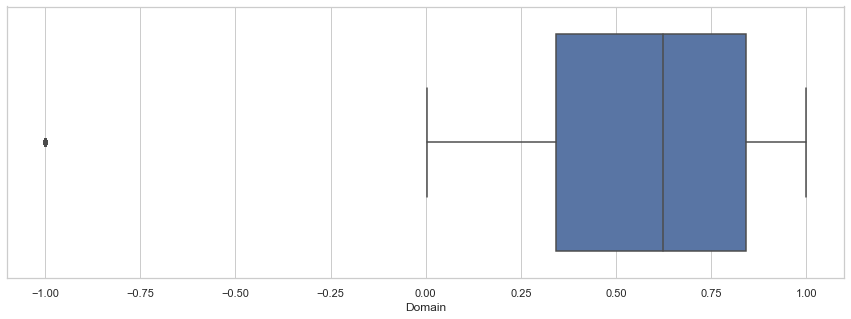

In [44]:
plt.figure(figsize=(15,5))
sns.boxplot(x="Domain",data=data)

With the above box plot it looks like there are outliers in the Domain and thats -1, so replacing with mean won't be good choice. We can take the set which doesnt have -1 and take its mean and replace the value but median seems better choice and mode better than median but with median or mode, we can go with anyone. Lets go with median

In [45]:
data["Domain"].replace(-1,data["Domain"].median(),inplace=True)

In [46]:
data.replace(-1,0,inplace=True)

### Correlation

<AxesSubplot:>

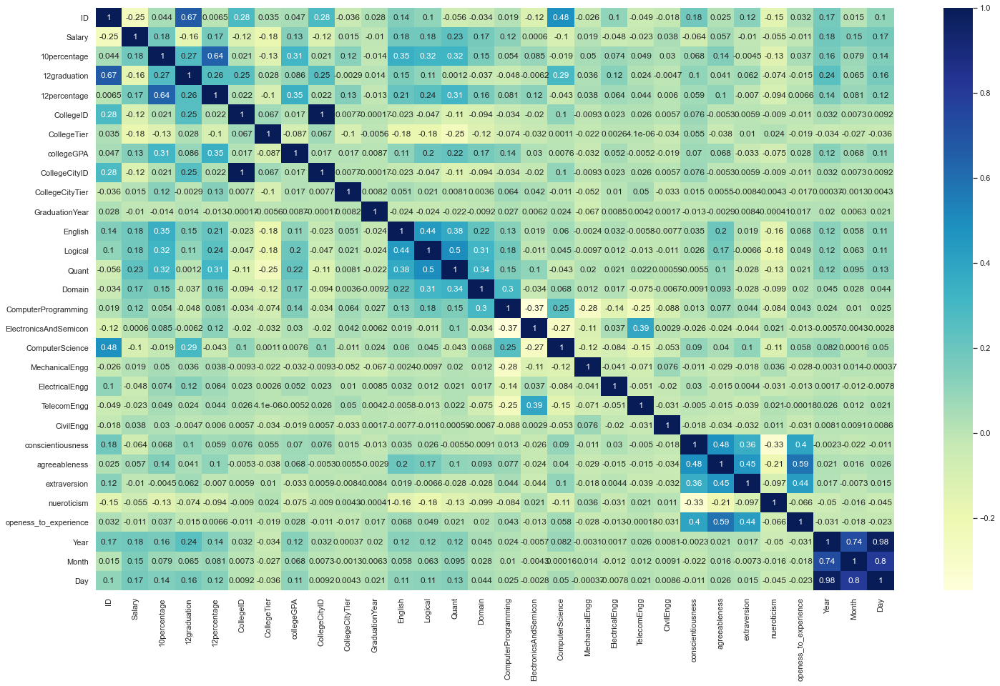

In [47]:
plt.figure(figsize=(25,15))
sns.heatmap(data.corr(),annot=True, cmap = 'YlGnBu')

Looking Over pairplot and heatmap that mostly all features are independent.

### Crossplots

<Figure size 1008x1008 with 0 Axes>

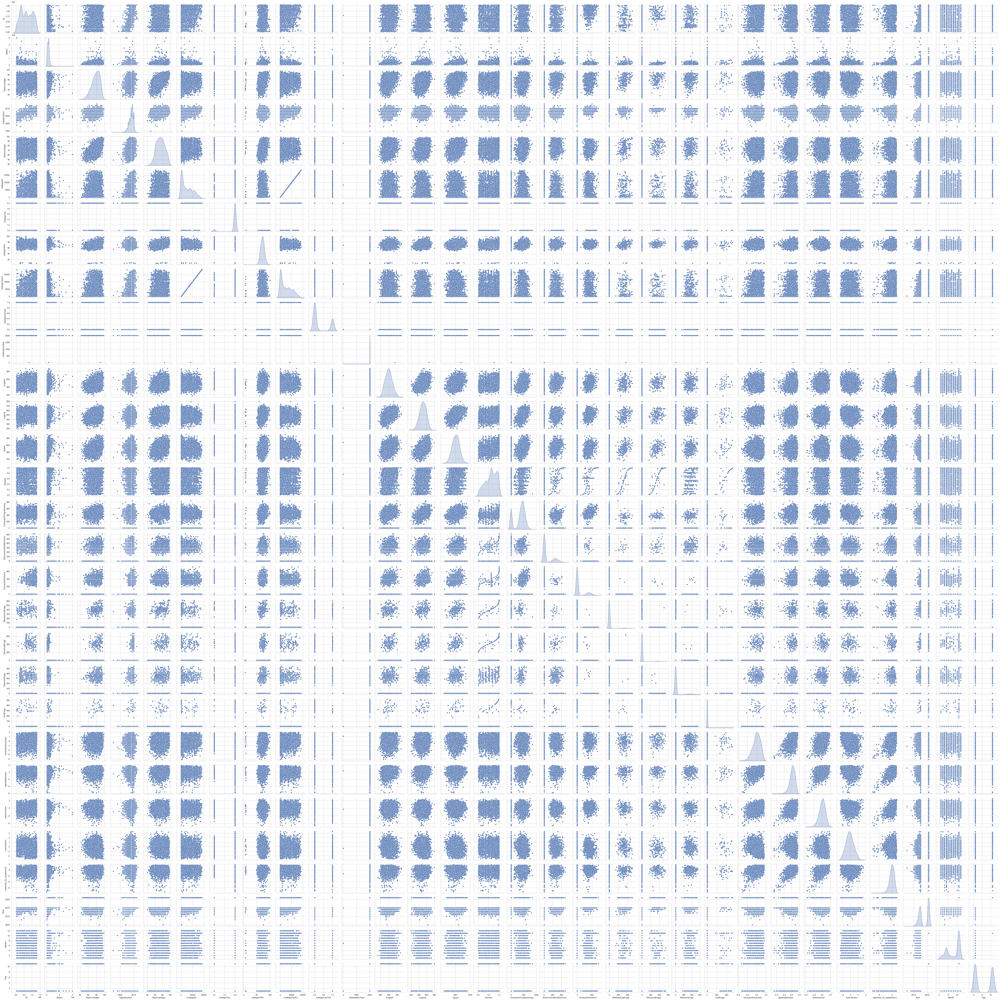

In [48]:
plt.figure(figsize=(14, 14))

sns.pairplot(data, diag_kind='kde');

Text(0.5, 0.98, 'Salary vs 12Board')

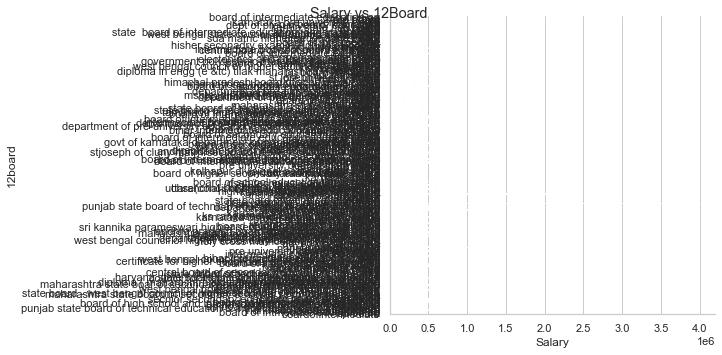

In [49]:
#bar graph of salary levels categorized based on 12th board. and ci=None suppresses error bars
#Students of icse board tend to earn higher salaries than the other two.
sns.factorplot(x='Salary', y='12board', kind='bar', data=data, ci=None , size=5,aspect=2)
plt.suptitle('Salary vs 12Board')

<AxesSubplot:xlabel='Logical', ylabel='Salary'>

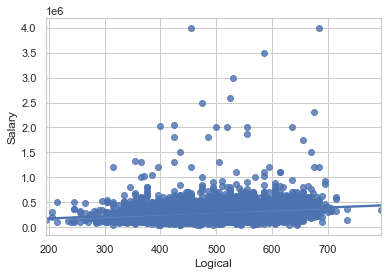

In [50]:
sns.regplot(x='Logical', y='Salary', data=data)

In [51]:
#creating new columns 
data['AverageScore']=(data['Logical']+data['Quant']+data['English'])/3
data['Acadperf']=data['10percentage']+data['12percentage']+data['collegeGPA']/3

<AxesSubplot:xlabel='AverageScore', ylabel='Salary'>

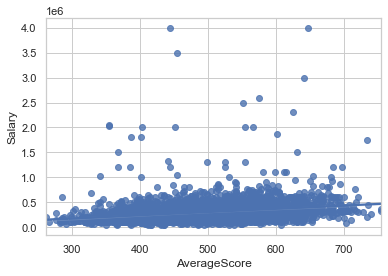

In [52]:
#lpositive correlation between salary and average(logical+quant+english) score is indicated
sns.regplot(x='AverageScore', y='Salary', data=data)

<AxesSubplot:>

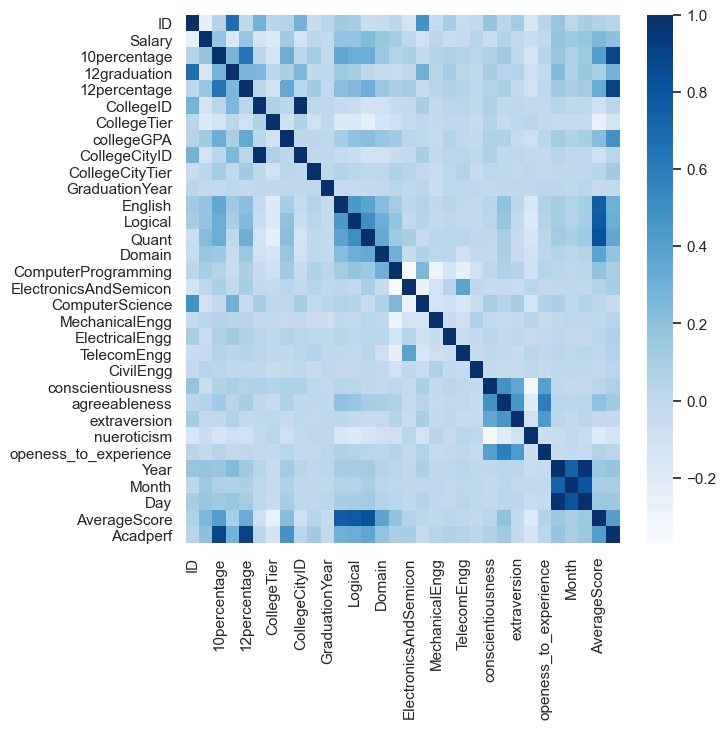

In [53]:
plt.figure(figsize= (7,7), dpi=100)
sns.heatmap(data.corr(), cmap = 'Blues') # plotting the correlation matrix of the dataset

<AxesSubplot:xlabel='ComputerProgramming', ylabel='Salary'>

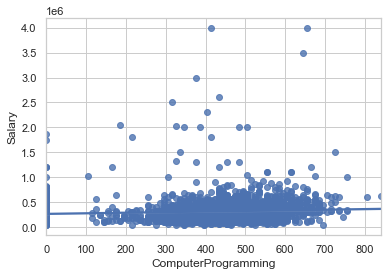

In [54]:
#positive correlation between salary and computer programming skills
sns.regplot(x='ComputerProgramming', y='Salary', data=data)

Text(0.5, 0.98, 'Salary levels by specialization')

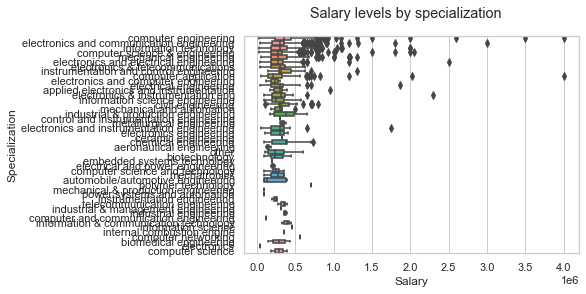

In [55]:
sns.boxplot(x='Salary', y = 'Specialization', data=data)
plt.suptitle('Salary levels by specialization')

### Data Preprocessing

In [56]:
# row in which value of 'salary less than certian amount
for i in range(1,8):
    seriesObj = data.apply(lambda x: True if x['Salary'] <= 250000*i  else False , axis=1)
    # Count number of True in series
    numOfRows = len(seriesObj[seriesObj == True].index)
 
    print('Number of Rows in dataframe in which Salary %d  : '%((250000*i)), numOfRows)

Number of Rows in dataframe in which Salary 250000  :  1710
Number of Rows in dataframe in which Salary 500000  :  3682
Number of Rows in dataframe in which Salary 750000  :  3928
Number of Rows in dataframe in which Salary 1000000  :  3961
Number of Rows in dataframe in which Salary 1250000  :  3974
Number of Rows in dataframe in which Salary 1500000  :  3980
Number of Rows in dataframe in which Salary 1750000  :  3981


In [57]:
indexNames = data[ data['Salary'] > 1000000 ].index
 
# Delete these row indexes from dataFrame
data.drop(indexNames , inplace=True)
data.shape

(3961, 44)

Only year is retained from the DOB column.

In [58]:
(data == 0).astype(int).sum(axis=0) #counting the number of 0's per column

Unnamed: 0                  0
ID                          0
Salary                      0
DOJ                         0
DOL                         0
Designation                 0
JobCity                     0
Gender                      0
DOB                         0
10percentage                0
10board                     0
12graduation                0
12percentage                0
12board                     0
CollegeID                   0
CollegeTier                 0
Degree                      0
Specialization              0
collegeGPA                  0
CollegeCityID               0
CollegeCityTier          2770
CollegeState                0
GraduationYear              1
English                     0
Logical                     0
Quant                       0
Domain                      0
ComputerProgramming       863
ElectronicsAndSemicon    2827
ComputerScience          3065
MechanicalEngg           3730
ElectricalEngg           3800
TelecomEngg              3589
CivilEngg 

In [59]:
data.isin([-1, 'NaN']).sum() #finding number of null values

Unnamed: 0               0
ID                       0
Salary                   0
DOJ                      0
DOL                      0
Designation              0
JobCity                  0
Gender                   0
DOB                      0
10percentage             0
10board                  0
12graduation             0
12percentage             0
12board                  0
CollegeID                0
CollegeTier              0
Degree                   0
Specialization           0
collegeGPA               0
CollegeCityID            0
CollegeCityTier          0
CollegeState             0
GraduationYear           0
English                  0
Logical                  0
Quant                    0
Domain                   0
ComputerProgramming      0
ElectronicsAndSemicon    0
ComputerScience          0
MechanicalEngg           0
ElectricalEngg           0
TelecomEngg              0
CivilEngg                0
conscientiousness        0
agreeableness            0
extraversion             0
n

In [60]:
data['12board'].unique()

array(['board of intermediate education,ap', 'cbse', 'state board',
       'mp board', 'isc', 'icse', 'karnataka pre university board', 'up',
       'p u board, karnataka', 'dept of pre-university education', 'bie',
       'kerala state hse board', 'up board', 'bseb', 'chse', 'puc',
       ' upboard',
       'state  board of intermediate education, andhra pradesh',
       'karnataka state board',
       'west bengal state council of technical education', 'wbchse',
       'maharashtra state board', 'ssc', 'isc board',
       'sda matric higher secondary school', 'uttar pradesh board', 'ibe',
       'chsc', 'board of intermediate', 'isce', 'upboard', 'sbtet',
       'hisher seconadry examination(state board)', 'pre university',
       'borad of intermediate', 'j & k board',
       'intermediate board of andhra pardesh', 'rbse',
       'central board of secondary education', 'jkbose', 'hbse',
       'board of intermediate education', 'state', 'ms board', 'pue',
       'intermediate state 

In [61]:
replace_list_state=['board of intermediate education,ap', 'state board',
       'mp board',  'karnataka pre university board', 'up',
       'p u board, karnataka', 'dept of pre-university education', 'bie',
       'kerala state hse board', 'up board', 'bseb', 'chse', 'puc',
       ' upboard',
       'state  board of intermediate education, andhra pradesh',
       'karnataka state board',
       'west bengal state council of technical education', 'wbchse',
       'maharashtra state board', 'ssc',
       'sda matric higher secondary school', 'uttar pradesh board', 'ibe',
       'chsc', 'board of intermediate', 'upboard', 'sbtet',
       'hisher seconadry examination(state board)', 'pre university',
       'borad of intermediate', 'j & k board',
       'intermediate board of andhra pardesh', 'rbse',
       'central board of secondary education', 'jkbose', 'hbse',
       'board of intermediate education', 'state', 'ms board', 'pue',
       'intermediate state board', 'stateboard', 'hsc',
       'electonincs and communication(dote)', 'karnataka pu board',
       'government polytechnic mumbai , mumbai board', 'pu board',
       'baord of intermediate education', 'apbie', 'andhra board',
       'tamilnadu stateboard',
       'west bengal council of higher secondary education',
       'cbse,new delhi', 'u p board', 'intermediate', 'biec,patna',
       'diploma in engg (e &tc) tilak maharashtra vidayapeeth',
       'hsc pune', 'pu board karnataka', 'kerala', 'gsheb',
       'up(allahabad)', 'nagpur', 'st joseph hr sec school',
       'pre university board', 'ipe', 'maharashtra', 'kea', 'apsb',
       'himachal pradesh board of school education', 'staae board',
       'international baccalaureate (ib) diploma', 'nios',
       'karnataka board of university',
       'board of secondary education rajasthan', 'uttarakhand board',
       'ua', 'scte vt orissa', 'matriculation',
       'department of pre-university education', 'wbscte',
       'preuniversity board(karnataka)', 'jharkhand accademic council',
       'bieap', 'msbte (diploma in computer technology)',
       'jharkhand acamedic council (ranchi)',
       'department of pre-university eduction', 'biec',
       'sjrcw', ' board of intermediate', 'msbte',
       'sri sankara vidyalaya', 'chse, odisha', 'bihar board',
       'maharashtra state(latur board)', 'rajasthan board', 'mpboard',
       'state board of technical eduction panchkula', 'upbhsie', 'apbsc',
       'state board of technical education and training',
       'secondary board of rajasthan',
       'tamilnadu higher secondary education board',
       'jharkhand academic council',
       'board of intermediate education,hyderabad', 'up baord', 'pu',
       'dte', 'board of secondary education', 'pre-university',
       'board of intermediate education,andhra pradesh',
       'up board , allahabad', 'srv girls higher sec school,rasipuram',
       'intermediate board of education,andhra pradesh',
       'intermediate board examination',
       'department of pre-university education, bangalore',
       'stmiras college for girls', 'mbose',
       'department of pre-university education(government of karnataka)',
       'dpue', 'msbte pune', 'board of school education harayana',
       'sbte, jharkhand', 'bihar intermediate education council, patna',
       'higher secondary', 's j polytechnic', 'latur',
       'board of secondary education, rajasthan', 'jyoti nivas', 'pseb',
       'biec-patna', 'board of intermediate education,andra pradesh',
       'chse,orissa', 'pre-university board', 'mp', 'intermediate board',
       'govt of karnataka department of pre-university education',
       'karnataka education board',
       'board of secondary school of education', 'pu board ,karnataka',
       'karnataka secondary education board', 'karnataka sslc',
       'board of intermediate ap', 'u p', 'state board of karnataka',
       'directorate of technical education,banglore', 'matric board',
       'andhpradesh board of intermediate education',
       'stjoseph of cluny matrhrsecschool,neyveli,cuddalore district',
       'bte up', 'scte and vt ,orissa', 'hbsc',
       'jawahar higher secondary school', 'nagpur board', 'bsemp',
       'board of intermediate education, andhra pradesh',
       'board of higher secondary orissa',
       'board of secondary education,rajasthan(rbse)',
       'board of intermediate education:ap,hyderabad', 'science college',
       'karnatak pu board', 'aissce', 'pre university board of karnataka',
       'bihar', 'kerala state board', 'uo board', 
       'karnataka board', 'tn state board',
       'kolhapur divisional board, maharashtra',
       'jaycee matriculation school',
       'board of higher secondary examination, kerala',
       'uttaranchal state board', 'intermidiate', 'bciec,patna', 'bice',
       'karnataka state', 'state broad', 'wbbhse', 'gseb',
       'uttar pradesh', 'ghseb', 'board of school education uttarakhand',
       'gseb/technical education board', 'msbshse,pune',
       'tamilnadu state board', 'board of technical education',
       'kerala university', 'uttaranchal shiksha avam pariksha parishad',
       'chse(concil of higher secondary education)',
       'bright way college, (up board)', 'board of intermidiate',
       'higher secondary state certificate', 'karanataka secondary board',
       'maharashtra board', 'cgbse', 'diploma in computers', 'bte,delhi',
       'rajasthan board ajmer', 'mpbse', 'pune board',
       'state board of technical education', 'gshseb',
       'amravati divisional board', 'dote (diploma - computer engg)',
       'karnataka pre-university board', 'jharkhand board',
       'punjab state board of technical education & industrial training',
       'department of technical education',
       'sri chaitanya junior kalasala', 'state board (jac, ranchi)',
       'aligarh muslim university', 'tamil nadu state board', 'hse',
       'karnataka secondary education', 'state board ',
       'karnataka pre unversity board',
       'ks rangasamy institute of technology',
       'karnataka board secondary education', 'narayana junior college',
       'bteup', 'board of intermediate(bie)', 'hsc maharashtra board',
       'tamil nadu state', 'uttrakhand board', 'psbte',
       'stateboard/tamil nadu', 'intermediate council patna',
       'technical board, punchkula', 'board of intermidiate examination',
       'sri kannika parameswari highier secondary school, udumalpet',
       'ap board', 'nashik board', 'himachal pradesh board',
       'maharashtra satate board',
       'andhra pradesh board of secondary education',
       'tamil nadu polytechnic',
       'maharashtra state board mumbai divisional board',
       'department of pre university education',
       'dav public school,hehal', 'board of intermediate education, ap',
       'rajasthan board of secondary education',
       'department of technical education, bangalore', 'chse,odisha',
       'maharashtra nasik board',
       'west bengal council of higher secondary examination (wbchse)',
       'holy cross matriculation hr sec school', 'cbsc',
       'pu  board karnataka', 'biec patna', 'kolhapur', 'bseb, patna',
       'up board allahabad', 'nagpur board,nagpur', 'diploma(msbte)',
       'dav public school', 'pre university board, karnataka',
       'ssm srsecschool', 'state bord', 'jstb,jharkhand',
       'intermediate board of education', 'mp board bhopal', 'pub',
       'madhya pradesh board', 'bihar intermediate education council',
       'west bengal council of higher secondary eucation',
        'mpc',
       'certificate for higher secondary education (chse)orissa',
       'maharashtra state board for hsc',
       'board of intermeadiate education', 'latur board',
       'andhra pradesh', 'karnataka pre-university',
       'lucknow public college', 'nagpur divisional board',
       'ap intermediate board', 'cgbse raipur', 'uttranchal board',
       'jiec', 
       'bihar school examination board patna',
       'state board of technical education harayana', 'mp-bse',
       'up bourd', 'dav public school sec 14',
       'haryana state board of technical education chandigarh',
       'council for indian school certificate examination',
       'jaswant modern school', 'madhya pradesh open school',
       'aurangabad board', 'j&k state board of school education',
       'diploma ( maharashtra state board of technical education)',
       'board of technicaleducation ,delhi',
       'maharashtra state boar of secondary and higher secondary education',
       'hslc (tamil nadu state board)',
       'karnataka state examination board', 'puboard', 'nasik',
       'west bengal board of higher secondary education',
       'up board,allahabad', 'board of intrmediate education,ap', 
       'karnataka state pre- university board',
       'state board - west bengal council of higher secondary education : wbchse',
       'maharashtra state board of secondary & higher secondary education',
       'biec, patna', 'state syllabus', 'cbse board', 'scte&vt',
       'board of intermediate,ap',
       'secnior secondary education board of rajasthan',
       'maharashtra board, pune', 'rbse (state board)',
       'board of intermidiate education,ap',
       'board of high school and intermediate education uttarpradesh',
       'higher secondary education',
       'board fo intermediate education, ap', 'intermedite',
       'ap board for intermediate education', 'ahsec',
       'punjab state board of technical education & industrial training, chandigarh',
       'state board - tamilnadu', 'jharkhand acedemic council',
       'scte & vt (diploma)', 'karnataka pu',
       'board of intmediate education ap', 'up-board',
       'boardofintermediate']

In [62]:
#replacing the redundant values of the 12board column with 'state','cbse','icse' and 'n/a'
for i in replace_list_state:
    data['12board'].replace(i,'state',inplace=True)

replace_list_cbse=['cbse', 
       'all india board', 
       'central board of secondary education, new delhi', 'cbese']
for i in replace_list_cbse:
    data['12board'].replace(i,'cbse',inplace=True)

replace_list_icse=[ 'isc', 'icse', 'isc board', 'isce', 'cicse',
       'isc board , new delhi']
for i in replace_list_icse:
    data['12board'].replace(i,'icse',inplace=True)

data['12board'].replace(0,'n/a',inplace=True)

data['12board'].unique()

array(['state', 'cbse', 'icse'], dtype=object)

In [63]:
data['Degree'].unique()

array(['B.Tech/B.E.', 'MCA', 'M.Tech./M.E.', 'M.Sc. (Tech.)'],
      dtype=object)

One hot encoding specialization

<AxesSubplot:>

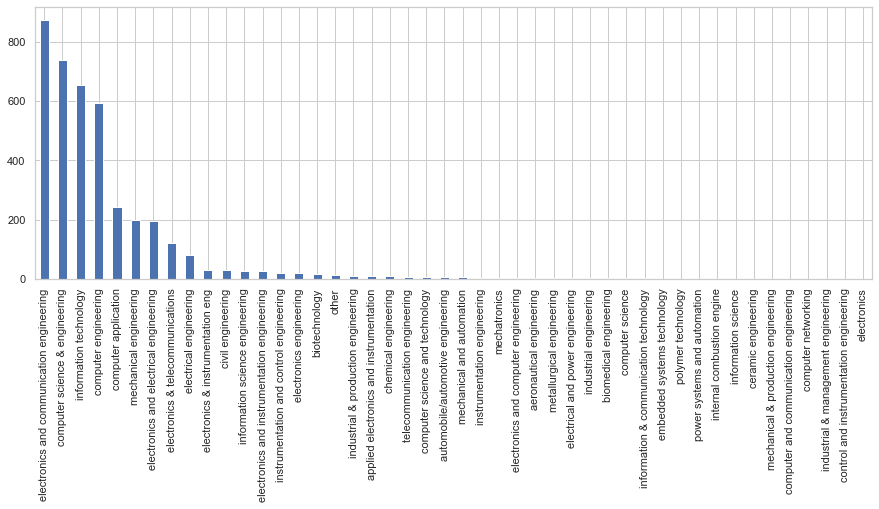

In [64]:
specialization_freq = data['Specialization'].value_counts()
specialization_freq.plot(kind='bar', figsize=(15,5))

From above we can see that top 3 Are from IT Domain. Now lets check for gender

(array([  0., 100., 200., 300., 400., 500., 600., 700.]),
 [Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, '')])

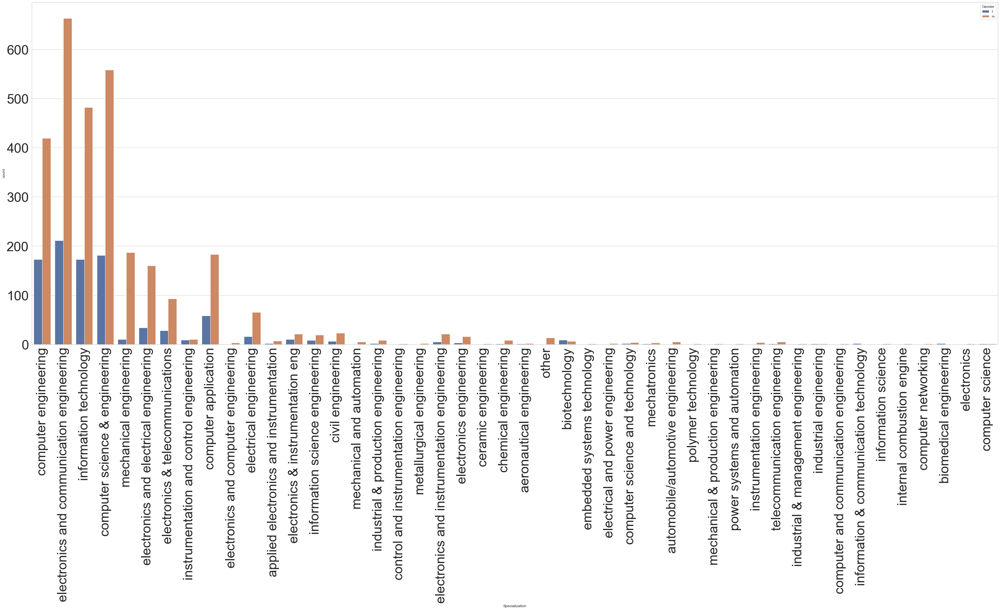

In [65]:
plt.figure(figsize=(55,20))
sns.countplot(x="Specialization",hue="Gender",data=data)
plt.xticks(fontsize=42,rotation=90)
plt.yticks(fontsize=42)

From above we can see that from all sectors many of the aspirants are males and it can be said that males and females both opting for amcat then maybe they are from IT Domain while from other domain it looks like either males or females apply. But males have high frequency over females in IT Domain as well as other sectors.

### Lets Check the Degree

<AxesSubplot:xlabel='Degree', ylabel='count'>

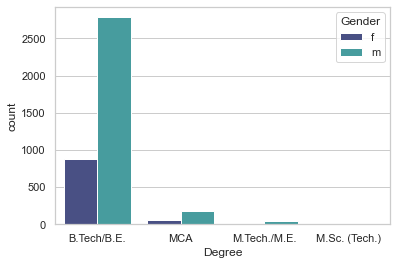

In [66]:
sns.countplot(x="Degree", hue="Gender", data=data, palette = 'mako')

Looking over the degree we can see that most of the aspirants have B.E/B.Tech Degree and In that males have high frequency.

So we can conclude that since the aspirants majorly are males and belong to IT department mostly with max education of BE, we have infered that in IT department majority of aspirants are Software Engineers With Average Salary of 300K with 5 Yrs exp. As per salary the highest is earned by IT Technician But has less experince than Software engineers. The field which has maximum experience is sr . Sw engineer but salary is more than sw engineer and less than IT technician.

### Lets see whether the IT domain falls in BE or not.

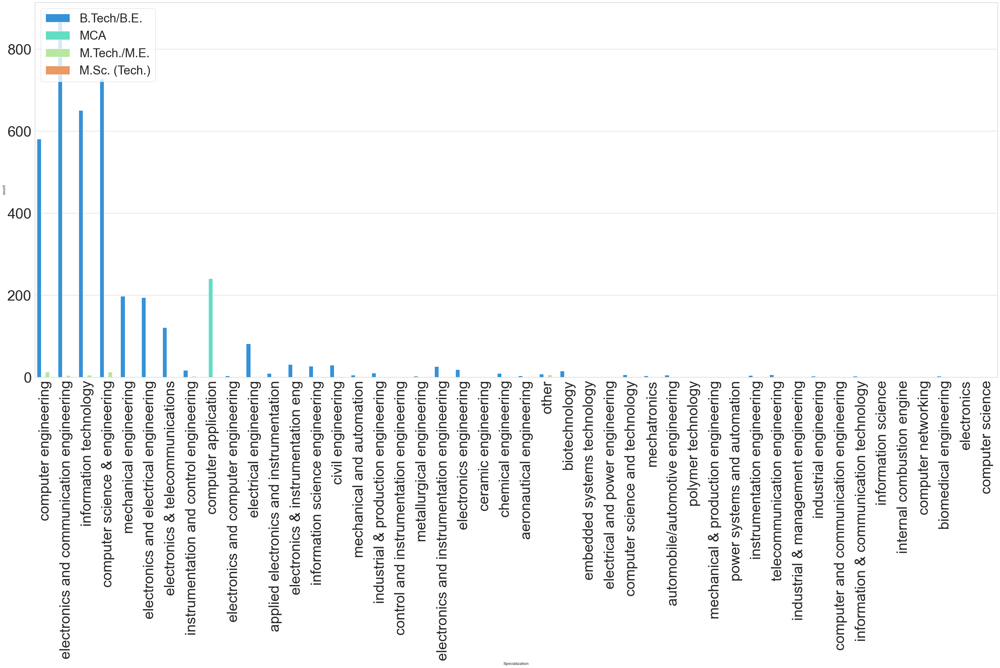

In [67]:
plt.figure(figsize = (50,20))
sns.countplot(x = "Specialization", hue = "Degree", data = data, palette = 'rainbow')
plt.xticks(fontsize=42,rotation=90)
plt.yticks(fontsize=42)
plt.legend(fontsize=35)

So it's confirmed that major aspirants dont exceed B.E degree.
### Lets check in which state most aspirants are working.

(array([  0., 100., 200., 300., 400., 500., 600., 700., 800., 900.]),
 [Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, '')])

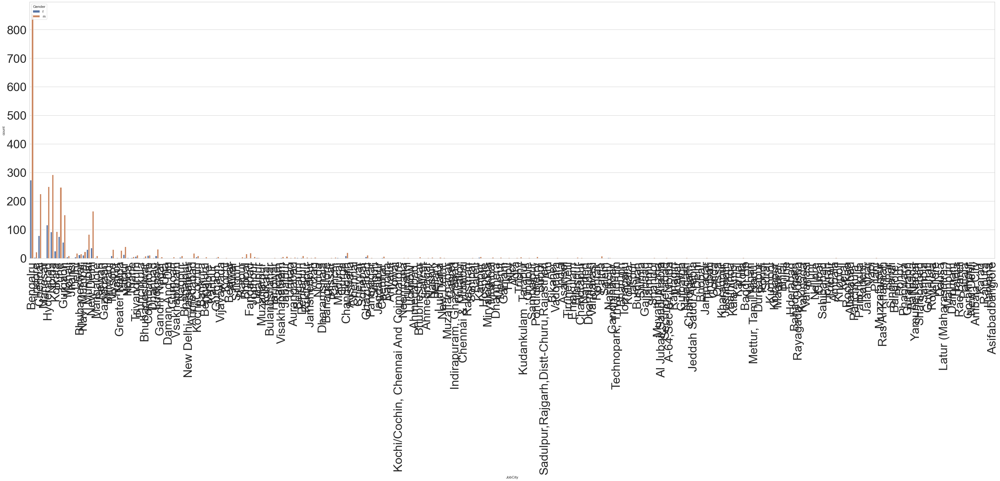

In [68]:
plt.figure(figsize=(55,15))
sns.countplot(x="JobCity",data=data,hue="Gender")
plt.xticks(fontsize=38,rotation=90)
plt.yticks(fontsize=38)

So from above we can say that most of the aspirants are from UP and that too most of them are males.
### Lets check graduation year

<AxesSubplot:xlabel='Designation', ylabel='count'>

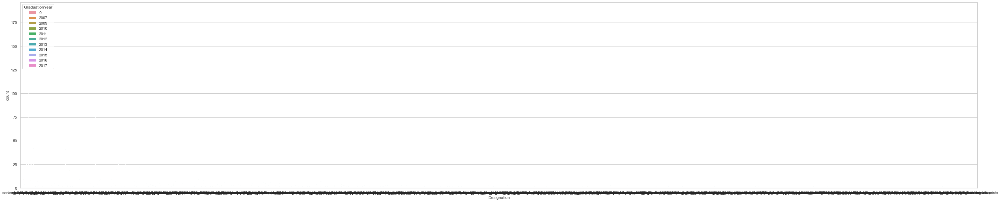

In [69]:
plt.figure(figsize=(50,10))
sns.countplot(x="Designation",data=data,hue="GraduationYear")

These are AMCAT aspirants and they have work experince of min 5 yrs both males and females but most of them males. So as we verified that most aspirants who are sw engineers are min 27 yrs old and have avg 5 yr exp with avg salary around 300 K and they work in Banglore state as they all are from IT background specialized in CSE field, we propose that these sw engineers are from thier hometown Uttar Pradesh and are 2013 passouts as shown below.

But all we saw was with wrt to what viusalization was, lets test a hypothesis for sw engg field to check whether of not the salary is >=300K,Age>=27,Exp=5.
- Salary<br>
    - $H_O\rightarrow\mu(Salary)\geq$300K<br>
    - $H_1\rightarrow\mu(Salary)<$300K
- Age<br>
    - $H_O\rightarrow\mu(Age)\geq$27<br>
    - $H_1\rightarrow\mu(Age)<$27K
- Experience<br>
    - $H_O\rightarrow\mu(XP)=$4<br>
    - $H_1\rightarrow\mu(XP)\neq$4

(array([  0.,  25.,  50.,  75., 100., 125., 150., 175., 200.]),
 [Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, '')])

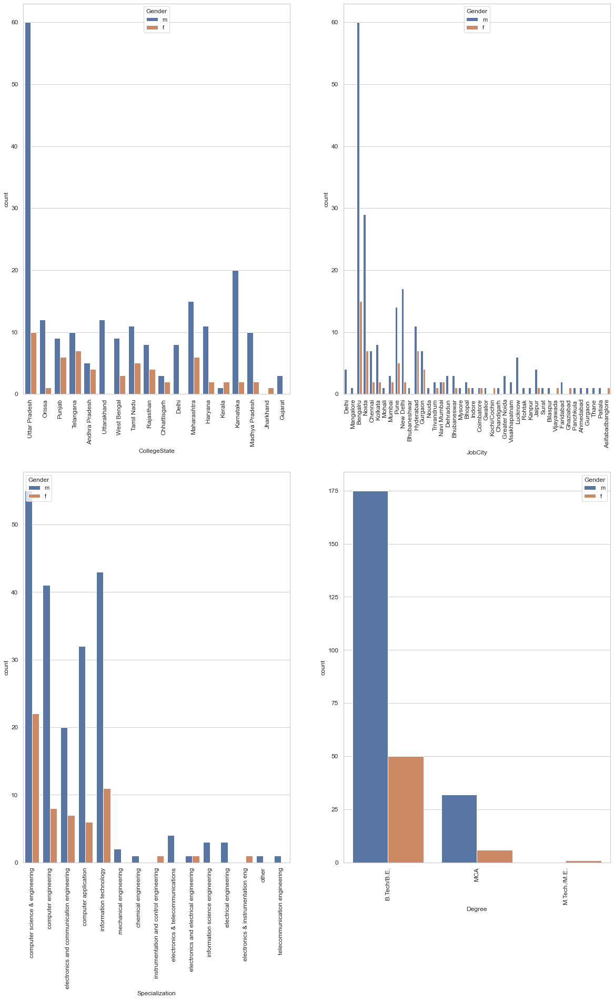

In [70]:
plt.figure(figsize=(20,30))
plt.subplot(221)
sns.countplot(x="CollegeState",data=data[data["Designation"]=="software developer"],hue="Gender")
plt.xticks(fontsize=12,rotation=90)
plt.yticks(fontsize=12)
plt.subplot(222)
sns.countplot(x="JobCity",data=data[data["Designation"]=="software developer"],hue="Gender")
plt.xticks(fontsize=12,rotation=90)
plt.yticks(fontsize=12)
plt.subplot(223)
sns.countplot(x="Specialization",data=data[data["Designation"]=="software developer"],hue="Gender")
plt.xticks(fontsize=12,rotation=90)
plt.yticks(fontsize=12)
plt.subplot(224)
sns.countplot(x="Degree",data=data[data["Designation"]=="software developer"],hue="Gender")
plt.xticks(fontsize=12,rotation=90)
plt.yticks(fontsize=12)

So for Sw dev which is second top aspirant have avg exp of around 4 and salary around 200K and age around 25 to 28 or to be precise range of 20 to 35 and most of them are from UP and work In banglore city 2013 passouts. So Similarly We can say that most of the IT domain aspirants come from North and most of them work in Banglore State. Lets verify This via hypothesis.

- Salary<br>
    - $H_O\rightarrow\mu(Salary)\geq$200K<br>
    - $H_1\rightarrow\mu(Salary)<$200K
- Age<br>
    - $H_O\rightarrow\mu(Age)\geq$26<br>
    - $H_1\rightarrow\mu(Age)<$26K
- Experience<br>
    - $H_O\rightarrow\mu(XP)=$3<br>
    - $H_1\rightarrow\mu(XP)\neq$3

In [71]:
specialization_map = \
{'electronics and communication engineering' : 'EC',
 'computer science & engineering' : 'CS',
 'information technology' : 'CS' ,
 'computer engineering' : 'CS',
 'computer application' : 'CS',
 'mechanical engineering' : 'ME',
 'electronics and electrical engineering' : 'EC',
 'electronics & telecommunications' : 'EC',
 'electrical engineering' : 'EL',
 'electronics & instrumentation eng' : 'EC',
 'civil engineering' : 'CE',
 'electronics and instrumentation engineering' : 'EC',
 'information science engineering' : 'CS',
 'instrumentation and control engineering' : 'EC',
 'electronics engineering' : 'EC',
 'biotechnology' : 'other',
 'other' : 'other',
 'industrial & production engineering' : 'other',
 'chemical engineering' : 'other',
 'applied electronics and instrumentation' : 'EC',
 'computer science and technology' : 'CS',
 'telecommunication engineering' : 'EC',
 'mechanical and automation' : 'ME',
 'automobile/automotive engineering' : 'ME',
 'instrumentation engineering' : 'EC',
 'mechatronics' : 'ME',
 'electronics and computer engineering' : 'CS',
 'aeronautical engineering' : 'ME',
 'computer science' : 'CS',
 'metallurgical engineering' : 'other',
 'biomedical engineering' : 'other',
 'industrial engineering' : 'other',
 'information & communication technology' : 'EC',
 'electrical and power engineering' : 'EL',
 'industrial & management engineering' : 'other',
 'computer networking' : 'CS',
 'embedded systems technology' : 'EC',
 'power systems and automation' : 'EL',
 'computer and communication engineering' : 'CS',
 'information science' : 'CS',
 'internal combustion engine' : 'ME',
 'ceramic engineering' : 'other',
 'mechanical & production engineering' : 'ME',
 'control and instrumentation engineering' : 'EC',
 'polymer technology' : 'other',
 'electronics' : 'EC'}

Bringing the CGPA to a 0-100 scale

<AxesSubplot:ylabel='Frequency'>

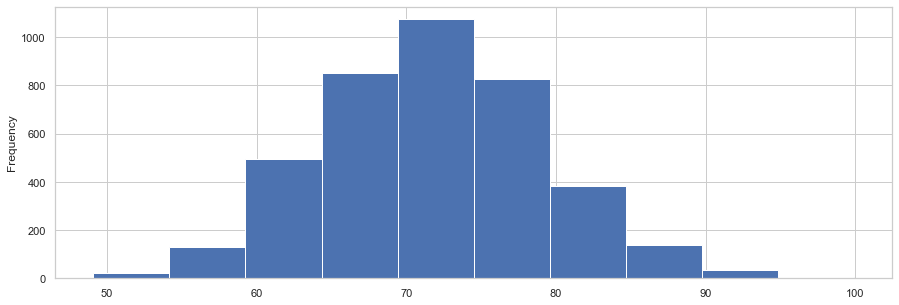

In [72]:
data.loc[data['collegeGPA'] <= 10, 'collegeGPA'] *= 10
data['collegeGPA'].plot(kind='hist', figsize=(15,5))

### Removing the other depts

In [73]:
clean_data=pd.DataFrame()
clean_data=data[data['ComputerScience']>0]

In [74]:
clean_data.shape

(896, 44)

In [75]:
clean_data['Specialization'].unique()

array(['electronics and communication engineering',
       'computer science & engineering',
       'instrumentation and control engineering', 'computer application',
       'information technology', 'information science engineering',
       'electronics and computer engineering', 'computer engineering',
       'electronics and electrical engineering', 'mechanical engineering',
       'chemical engineering', 'electronics engineering',
       'computer science and technology', 'electrical engineering',
       'electronics & telecommunications',
       'electronics & instrumentation eng',
       'computer and communication engineering',
       'information & communication technology',
       'telecommunication engineering', 'other', 'computer science',
       'biotechnology'], dtype=object)

In [76]:
category_list=[ 'Gender', '12board', 'Degree','Specialization'
        ]
numeric_list=[ 'Salary','10percentage', '12percentage', 'collegeGPA',
        'English', 'Logical', 'Quant',
       'Domain', 'ComputerProgramming', 'ComputerScience', 'conscientiousness', 'agreeableness', 'extraversion',
       'nueroticism', 'openess_to_experience', '12GradAge',
       'GradAge']

In [77]:
clean_data.columns

Index(['Unnamed: 0', 'ID', 'Salary', 'DOJ', 'DOL', 'Designation', 'JobCity',
       'Gender', 'DOB', '10percentage', '10board', '12graduation',
       '12percentage', '12board', 'CollegeID', 'CollegeTier', 'Degree',
       'Specialization', 'collegeGPA', 'CollegeCityID', 'CollegeCityTier',
       'CollegeState', 'GraduationYear', 'English', 'Logical', 'Quant',
       'Domain', 'ComputerProgramming', 'ElectronicsAndSemicon',
       'ComputerScience', 'MechanicalEngg', 'ElectricalEngg', 'TelecomEngg',
       'CivilEngg', 'conscientiousness', 'agreeableness', 'extraversion',
       'nueroticism', 'openess_to_experience', 'Year', 'Month', 'Day',
       'AverageScore', 'Acadperf'],
      dtype='object')

In [78]:
clean_data.to_csv('aspiring_minds_employability_outcomes_2015.csv', index=False) #data without one hot encoding. for visualization purposes

One hot encoding the categorical columns

In [79]:
for feature in category_list:
    clean_data = pd.get_dummies(clean_data, prefix=feature, columns=[feature])

Categorizing the salary to 5 categories

In [80]:
from sklearn import preprocessing

#z=pd.DataFrame(X_train_scaled)
#y=pd.DataFrame(Y_train_scaled)
 
 
#set up bins
bin = [0,.25,.5,.75,1]

#use pd.cut function can attribute the values into its specific bins
category = pd.qcut(clean_data['Salary'],bin)
category = category.to_frame()
category.columns = ['Sal']

#concatenate age and its bin
y_cat = pd.concat([clean_data['Salary'],category],axis = 1)

#labelencode
le = preprocessing.LabelEncoder()
le.fit(y_cat['Sal'])
le.classes_
Y_train_cat=le.transform(y_cat['Sal'])

In [81]:
Y_train_cat

array([2, 2, 2, 2, 3, 3, 1, 3, 0, 1, 0, 3, 1, 3, 2, 2, 2, 1, 0, 2, 2, 1,
       2, 2, 0, 2, 2, 3, 0, 3, 0, 2, 1, 0, 1, 0, 0, 0, 1, 2, 0, 2, 2, 1,
       1, 3, 0, 2, 2, 1, 3, 0, 1, 0, 2, 0, 2, 2, 0, 2, 3, 0, 2, 2, 0, 2,
       2, 3, 1, 2, 2, 2, 3, 0, 0, 1, 0, 2, 2, 1, 1, 1, 1, 0, 3, 0, 0, 1,
       3, 1, 2, 3, 2, 2, 3, 0, 2, 0, 2, 2, 2, 0, 3, 0, 3, 3, 3, 0, 1, 2,
       0, 1, 0, 0, 2, 1, 1, 3, 0, 0, 2, 0, 0, 2, 2, 2, 2, 2, 0, 1, 2, 3,
       3, 3, 3, 2, 2, 3, 0, 2, 1, 2, 0, 2, 2, 0, 1, 1, 3, 0, 0, 0, 0, 0,
       3, 2, 0, 2, 0, 2, 2, 2, 3, 2, 2, 0, 1, 1, 3, 0, 1, 2, 1, 2, 3, 2,
       3, 0, 2, 3, 1, 2, 1, 0, 3, 0, 0, 2, 0, 2, 0, 0, 1, 0, 2, 0, 0, 1,
       2, 3, 0, 1, 2, 3, 2, 0, 3, 1, 2, 0, 3, 3, 3, 3, 3, 2, 3, 0, 2, 0,
       2, 0, 2, 1, 3, 2, 3, 3, 3, 3, 0, 2, 0, 1, 0, 3, 3, 2, 3, 0, 0, 0,
       2, 3, 3, 0, 0, 1, 0, 2, 3, 0, 3, 1, 2, 0, 2, 0, 0, 0, 0, 3, 2, 0,
       3, 1, 1, 2, 0, 3, 1, 0, 2, 3, 2, 0, 0, 0, 1, 3, 2, 0, 3, 0, 1, 3,
       3, 3, 3, 0, 0, 1, 3, 1, 0, 3, 1, 0, 2, 3, 2,

In [82]:
X_train=pd.DataFrame(clean_data.drop(columns=['Salary'],axis=1))
Y_train=pd.DataFrame(clean_data['Salary'])
Y_train_cat=pd.DataFrame(Y_train_cat)
print(X_train.shape,Y_train.shape,Y_train_cat.shape)

(896, 70) (896, 1) (896, 1)


Saving the data to apply the models

In [83]:
X_train.to_csv('X_train.csv', index=False)
Y_train.to_csv('Y_train.csv',header=True, index=False, index_label='Salary')
Y_train_cat.to_csv('Y_train_cat.csv',header=True, index=False, index_label='Salary')
clean_data.to_csv('clean_data.csv', index=False)

In [84]:
!pip install sweetviz

In [85]:
#to visualize the data
import sweetviz as sv
my_report = sv.analyze(data)
my_report.show_html()

                                             |                                             | [  0%]   00:00 ->…

Report SWEETVIZ_REPORT.html was generated! NOTEBOOK/COLAB USERS: the web browser MAY not pop up, regardless, the report IS saved in your notebook/colab files.


## Final Conclusion:

### So finally we infer that most of the amcat aspirants are males with avg age around 27 coming from northern side from UP and are from IT domain with most of them as SW engineers as profession working in banglore with degree : specialization as BE:CSE having exp of 4 yrs and salary around 300 k.

### So after sw engineer, as extra we looked at second highest proffesion sw developer after sw engineer and for sw developer the average salary is 250k and avg age of 26 yrs and exp of 3 yrs and like sw engg they too come from UP who work in banglore and same like them have specialization:degree as BE:CSE.

## Thank you